# Eksperimen: Transformasi Domain Frekuensi ke Domain Waktu 🎵
## Studi Kasus: Sinyal Musik (atau Sinyal Sintetis) + Audio Player

Eksperimen ini bertujuan untuk:
- Memuat sinyal audio atau membuat sinyal sintetis
- Mengubahnya ke domain frekuensi dengan FFT
- Mengidentifikasi frekuensi dominan
- Mengembalikan sinyal ke domain waktu dengan IFFT
- Membandingkan hasil rekonstruksi penuh vs rekonstruksi frekuensi dominan

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.fft import fft, ifft
from IPython.display import Audio, display

# Load Audio

In [2]:
try:
    sample_rate, audio_data = wavfile.read("/kaggle/input/everything-u-are-clip/everything-u-are.wav")
    if audio_data.ndim > 1:
        audio_data = audio_data[:, 0]
    print("Audio loaded from file.")
except FileNotFoundError:
    print("File musik.wav tidak ditemukan, menggunakan sinyal sintetis.")
    sample_rate = 44100
    t = np.linspace(0, 3, 3 * sample_rate, endpoint=False)
    audio_data = (0.5 * np.sin(2 * np.pi * 440 * t) +
                  0.3 * np.sin(2 * np.pi * 880 * t))

audio_data = audio_data / np.max(np.abs(audio_data))

print("▶ Audio Asli:")
display(Audio(audio_data, rate=sample_rate))

Audio loaded from file.
▶ Audio Asli:


# FFT & Spektrum Frekuensi

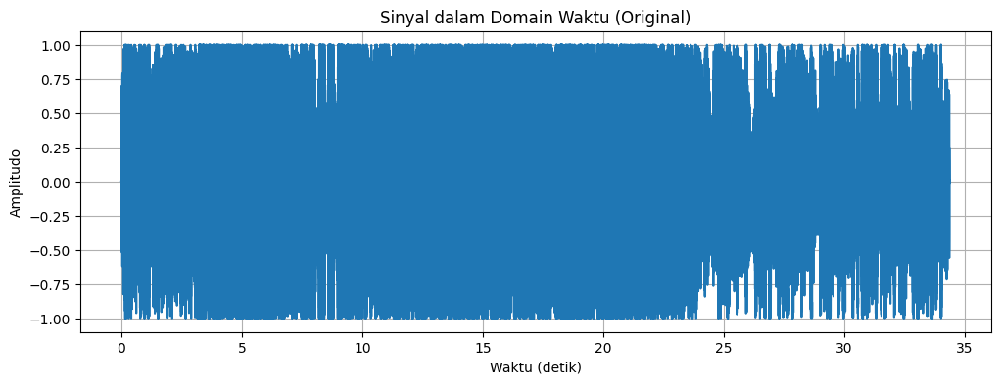

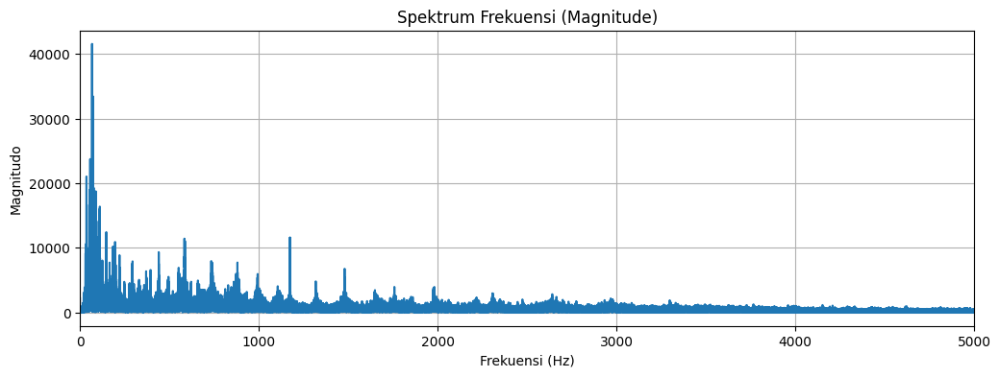

In [3]:
N = len(audio_data)
freq_spectrum = fft(audio_data)
freqs = np.fft.fftfreq(N, 1 / sample_rate)

half_N = N // 2
freqs_half = freqs[:half_N]
spectrum_half = np.abs(freq_spectrum[:half_N])

plt.figure(figsize=(12, 4))
plt.plot(np.linspace(0, len(audio_data) / sample_rate, N), audio_data)
plt.title("Sinyal dalam Domain Waktu (Original)")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 4))
plt.plot(freqs_half, spectrum_half)
plt.title("Spektrum Frekuensi (Magnitude)")
plt.xlabel("Frekuensi (Hz)")
plt.ylabel("Magnitudo")
plt.xlim(0, 5000)
plt.grid(True)
plt.show()

# Identifikasi Frekuensi Dominan

In [4]:
top_k = 6
dominant_indices = np.argsort(spectrum_half)[-top_k:][::-1]
dominant_freqs = freqs_half[dominant_indices]
dominant_magnitudes = spectrum_half[dominant_indices]

print("Frekuensi Dominan:")
for f, mag in zip(dominant_freqs, dominant_magnitudes):
    print(f"{f:.2f} Hz  |  Magnitudo: {mag:.2f}")

Frekuensi Dominan:
67.59 Hz  |  Magnitudo: 41565.17
72.80 Hz  |  Magnitudo: 33448.37
71.49 Hz  |  Magnitudo: 26576.91
57.20 Hz  |  Magnitudo: 23738.60
66.28 Hz  |  Magnitudo: 22801.40
36.40 Hz  |  Magnitudo: 21043.59


# Rekonstruksi Sinyal (IFFT)

In [5]:
reconstructed_signal = np.real(ifft(freq_spectrum))

filtered_spectrum = np.zeros_like(freq_spectrum, dtype=complex)
for idx in dominant_indices:
    filtered_spectrum[idx] = freq_spectrum[idx]
    filtered_spectrum[-idx] = freq_spectrum[-idx]

reconstructed_from_dominant = np.real(ifft(filtered_spectrum))

# Visualisasi Perbandingan

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


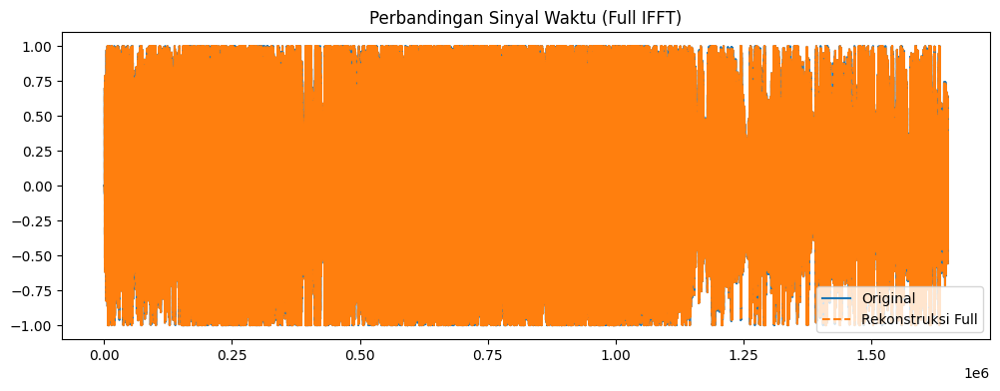

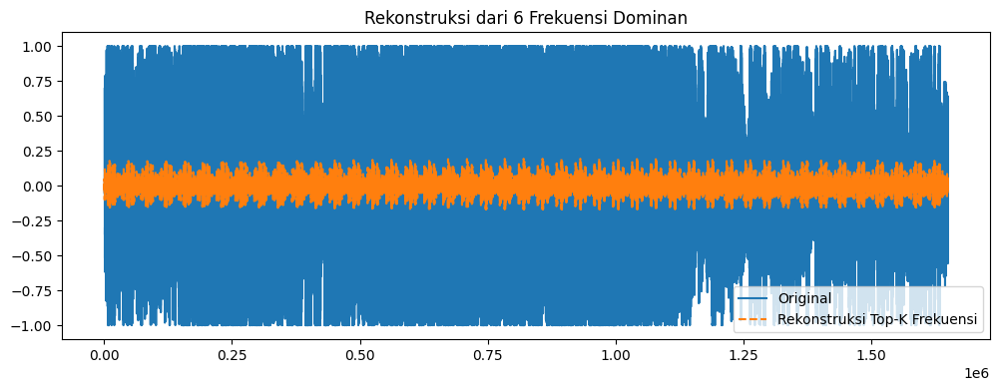

In [6]:
plt.figure(figsize=(12, 4))
plt.plot(audio_data, label="Original")
plt.plot(reconstructed_signal, linestyle='--', label="Rekonstruksi Full")
plt.legend()
plt.title("Perbandingan Sinyal Waktu (Full IFFT)")
plt.show()

plt.figure(figsize=(12, 4))
plt.plot(audio_data, label="Original")
plt.plot(reconstructed_from_dominant, linestyle='--', label="Rekonstruksi Top-K Frekuensi")
plt.legend()
plt.title(f"Rekonstruksi dari {top_k} Frekuensi Dominan")
plt.show()

# Audio Player Rekonstruksi

In [7]:
print("▶ Audio Rekonstruksi Full IFFT:")
display(Audio(reconstructed_signal, rate=sample_rate))

print("▶ Audio Rekonstruksi dari Frekuensi Dominan:")
display(Audio(reconstructed_from_dominant, rate=sample_rate))

▶ Audio Rekonstruksi Full IFFT:


▶ Audio Rekonstruksi dari Frekuensi Dominan:


# Analisis & Refleksi
## Analisis
- FFT memisahkan komponen frekuensi penyusun sinyal.
- Frekuensi dominan sesuai dengan nada/suara utama pada musik atau sinyal sintetis.
- IFFT mampu mengembalikan bentuk sinyal asli.
- Hanya menggunakan frekuensi dominan menghasilkan bentuk mirip tetapi detailnya hilang.

## Refleksi
- Eksperimen ini membantu memahami hubungan domain frekuensi dan waktu.
- Pada musik asli, spektrum lebih kompleks dibanding sinyal sintetis.
- Sangat relevan untuk analisis audio, kompresi, dan pengenalan pola suara.